<a href="https://colab.research.google.com/github/andremartins7/DataHackersSurvey2019/blob/master/NYC_Taxi_Duration.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

Autor:

Formação: Engenheiro de Computação pela UFG

Contato:
  
  📧 
  
  👉 [LinkedIn]()
  
  👉 [Github]()



# Projeto de Regressão Linear

> A regressão linear tenta modelar a relação entre duas (ou mais) variáveis ajustando uma equação linear aos dados observados. Para isso um variável é considerada uma variável independente e a outra é considerada uma variável dependente (alvo). Desta forma, o modelo de regressão linear utiliza dos valores da variável independente para prever os valores da variável dependente. 

A linha de regressão linear tem uma equação da forma 

$$\hat{y} = a + bx$$

onde
  * x é a variável independente;
  * $\hat{y}$ é a variável dependente; 
  * b é a inclinação da linha 
  * a é a interceptação (o valor de $\hat{y}$ quando x = 0).
 

O método mais comum para ajustar uma linha de regressão é o método dos mínimos quadrados. Esse método calcula a linha de melhor ajuste para os dados observados, minimizando a soma dos quadrados dos desvios verticais de cada ponto de dados para a linha (se um ponto estiver exatamente na linha ajustada, seu desvio vertical será 0) [[1]](http://www.stat.yale.edu/Courses/1997-98/101/linreg.htm#:~:text=Linear%20regression%20attempts%20to%20model,to%20be%20a%20dependent%20variable.).

--- 

## NYC Taxi Trip Duration

O *dataset* contém informações sobre o registro de viagens do *Yellow Cab* em 2016 em Nova York disponibilizados no *Big Query* no *Google Cloud Platform*.

O *dataset* conta com os seguintes atributos
  
  * `id`: o identificador de vada viagem realizada;
  * `vendor_id`: um código indicando o provedor associado ao registro de viagem;
  * `pickup_datetime`: data e hora em que o medidor foi inciado;
  * `dropoff_datetime`: data e hora em que o medidor foi finalizado;
  * `passenger_count`: o número de passageiros no veículo (valor inserido pelo motorista);
  * `pickup_longitude`: a longitude do local de partida da viagem onde o medidor foi inciado;
  * `pickup_latitude`: a latitude do local de partida da viagem onde o medidor foi inciado;
  * `dropoff_longitude`: a longitude do local de chegada da viagem onde o medidor foi desligado;
  * `dropoff_latitude`: a latitude do local de chegada da viagem onde o medidor foi desligado;
  * `store_and_fwd_flag`: indica se o registro da viagem foi retido na memória do veículo antes de ser enviado ao fornecedor
  * trip_duration: duração da viagem (em segundos).

O *dataset* pode ser encontrado [aqui](https://www.kaggle.com/yasserh/nyc-taxi-trip-duration).

# NYC Taxi Trip Duration



In [ ]:
#@title Importing Data
#@markdown Esta célula contém a importação do *dataset* e bibliotecas.
 
#@markdown >*Execute esta célula (`ctrl+enter` ou clicando no botão ao lado) para que o ambiente seja carregado.*

#@markdown *Obs: Caso deseje rodar este notebook na sua máquina altere o caminho da variável `path` para onde está armazenado seu dataset.*

import pandas as pd
import plotly.express as px

path = '/content/drive/MyDrive/Data Science/Dados/NYC Taxi Trip Duration/NYC.csv'

dataframe = pd.read_csv(path)

## Data Preparation and Cleaning

1. Conversão das colunas *'pickup_datetime, dropoff_datetime'*  para o formato *datetime*.
2. Converter coluna *'store_and_fwd_flag'* para o formato *boolean*.


In [ ]:
dataframe.head(3)

,id,vendor_id,pickup_datetime,dropoff_datetime,passenger_count,pickup_longitude,pickup_latitude,dropoff_longitude,dropoff_latitude,store_and_fwd_flag,trip_duration
0,id2875421,2,2016-03-14 17:24:55,2016-03-14 17:32:30,1,-73.982155,40.767937,-73.964630,40.765602,N,455
1,id2377394,1,2016-06-12 00:43:35,2016-06-12 00:54:38,1,-73.980415,40.738564,-73.999481,40.731152,N,663
2,id3858529,2,2016-01-19 11:35:24,2016-01-19 12:10:48,1,-73.979027,40.763939,-74.005333,40.710087,N,2124


In [ ]:
dataframe.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1458644 entries, 0 to 1458643
Data columns (total 11 columns):
 #   Column              Non-Null Count    Dtype  
---  ------              --------------    -----  
 0   id                  1458644 non-null  object 
 1   vendor_id           1458644 non-null  int64  
 2   pickup_datetime     1458644 non-null  object 
 3   dropoff_datetime    1458644 non-null  object 
 4   passenger_count     1458644 non-null  int64  
 5   pickup_longitude    1458644 non-null  float64
 6   pickup_latitude     1458644 non-null  float64
 7   dropoff_longitude   1458644 non-null  float64
 8   dropoff_latitude    1458644 non-null  float64
 9   store_and_fwd_flag  1458644 non-null  object 
 10  trip_duration       1458644 non-null  int64  
dtypes: float64(4), int64(3), object(4)
memory usage: 122.4+ MB


In [ ]:
dataframe.describe()

,vendor_id,passenger_count,pickup_longitude,pickup_latitude,dropoff_longitude,dropoff_latitude,trip_duration
count,1.458644e+06,1.458644e+06,1.458644e+06,1.458644e+06,1.458644e+06,1.458644e+06,1.458644e+06
mean,1.534950e+00,1.664530e+00,-7.397349e+01,4.075092e+01,-7.397342e+01,4.075180e+01,9.594923e+02
std,4.987772e-01,1.314242e+00,7.090186e-02,3.288119e-02,7.064327e-02,3.589056e-02,5.237432e+03
min,1.000000e+00,0.000000e+00,-1.219333e+02,3.435970e+01,-1.219333e+02,3.218114e+01,1.000000e+00
25%,1.000000e+00,1.000000e+00,-7.399187e+01,4.073735e+01,-7.399133e+01,4.073588e+01,3.970000e+02
50%,2.000000e+00,1.000000e+00,-7.398174e+01,4.075410e+01,-7.397975e+01,4.075452e+01,6.620000e+02
75%,2.000000e+00,2.000000e+00,-7.396733e+01,4.076836e+01,-7.396301e+01,4.076981e+01,1.075000e+03
max,2.000000e+00,9.000000e+00,-6.133553e+01,5.188108e+01,-6.133553e+01,4.392103e+01,3.526282e+06


In [ ]:
dataframe.isna().sum()  # Procurando por valores faltantes no dataset

id                    0
vendor_id             0
pickup_datetime       0
dropoff_datetime      0
passenger_count       0
pickup_longitude      0
pickup_latitude       0
dropoff_longitude     0
dropoff_latitude      0
store_and_fwd_flag    0
trip_duration         0
dtype: int64

In [ ]:
 # Transformando colunas 'pickup_datetime' & 'dropoff_datetime' para o formato datetime
 dataframe['pickup_datetime'] = pd.to_datetime(dataframe['pickup_datetime'], format='%Y-%m-%d %X')
 dataframe['dropoff_datetime'] = pd.to_datetime(dataframe['dropoff_datetime'], format='%Y-%m-%d %X')

 #dataframe['trip_duration'] = pd.to_numeric(dataframe['trip_duration'], downcast='integer')

In [ ]:
dataframe['store_and_fwd_flag'].unique()  # Verificando se existe algum valor diferente do N: no, Y: yes

array(['N', 'Y'], dtype=object)

In [ ]:
# Substituindo os valores N & Y pelos valores booleanos False e True
dataframe['store_and_fwd_flag'] = dataframe['store_and_fwd_flag'].map({'N': False, 'Y': True})

In [ ]:
dataframe.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1458644 entries, 0 to 1458643
Data columns (total 11 columns):
 #   Column              Non-Null Count    Dtype         
---  ------              --------------    -----         
 0   id                  1458644 non-null  object        
 1   vendor_id           1458644 non-null  int64         
 2   pickup_datetime     1458644 non-null  datetime64[ns]
 3   dropoff_datetime    1458644 non-null  datetime64[ns]
 4   passenger_count     1458644 non-null  int64         
 5   pickup_longitude    1458644 non-null  float64       
 6   pickup_latitude     1458644 non-null  float64       
 7   dropoff_longitude   1458644 non-null  float64       
 8   dropoff_latitude    1458644 non-null  float64       
 9   store_and_fwd_flag  1458644 non-null  bool          
 10  trip_duration       1458644 non-null  int64         
dtypes: bool(1), datetime64[ns](2), float64(4), int64(3), object(1)
memory usage: 112.7+ MB


## Exploratory Data Analysis


1. What is the peak time?
2. What is the average duration of each trip?
3. Where happen the most trips?

In [ ]:
dataframe.head(2)

,id,vendor_id,pickup_datetime,dropoff_datetime,passenger_count,pickup_longitude,pickup_latitude,dropoff_longitude,dropoff_latitude,store_and_fwd_flag,trip_duration
0,id2875421,2,2016-03-14 17:24:55,2016-03-14 17:32:30,1,-73.982155,40.767937,-73.964630,40.765602,False,455
1,id2377394,1,2016-06-12 00:43:35,2016-06-12 00:54:38,1,-73.980415,40.738564,-73.999481,40.731152,False,663


In [ ]:
# Criando uma cópia do dataframe original
peak_time = dataframe.copy()

# Criando colunas para armazenar somente a hora que o passageiro foi pego e deixado no destino
peak_time['pickup_hour'] = peak_time['pickup_datetime'].dt.hour
peak_time['dropoff_hour'] = peak_time['dropoff_datetime'].dt.hour

In [ ]:
# Verificando quantas corridas ocorreram em cada hora & verificando se existe algum valor outlier
peak_time['pickup_hour'].value_counts().sort_values(ascending=False)

18    90600
19    90308
21    84185
20    84072
22    80492
17    76483
14    74292
12    71873
15    71811
13    71473
23    69785
11    68476
9     67663
8     67053
10    65437
16    64313
7     55600
0     53248
1     38571
6     33248
2     27972
3     20895
4     15792
5     15002
Name: pickup_hour, dtype: int64

In [ ]:
px.histogram(peak_time,
             x='pickup_hour',
             nbins=24,
             title='Peak time to take a taxi').update_layout(bargap=0.2)

In [ ]:
px.histogram(peak_time,
             x='dropoff_hour',
             nbins=24,
             title='Peak time when you\'re drop off a taxi').update_layout(bargap=0.2)

> O horário de pico está entre **17hr e 22hr**, levando em consideração o fluxo de pessoas pegando o táxi, pessoas que estão numa corrida e horário que a corrida acaba. Outro período do dia que apresenta grande fluxo de pessoas pegando taxi é entre **12hr e 14hr**.

> Estes horários de pico estão diretamente relacionados com o fim de expediente e o horário de almoço, respectivamente.

---

In [ ]:
# Transformando as columas 'pickup_latitude' e 'pickup_longitude' para o tipo string
peak_time['pickup_latitude'] = peak_time['pickup_latitude'].astype(str)
peak_time['pickup_longitude'] = peak_time['pickup_longitude'].astype(str)

In [ ]:
# Criando nova coluna para armazenar a latitude e longitude do local de início da corrida do táxi
peak_time['coordenates'] = peak_time['pickup_latitude'].str.cat(peak_time['pickup_longitude'], sep=',')

In [ ]:
# Novo dataframe contendo informações apenas da coordenadas geográficas de onde começou a corrida do táxi
heatmap = pd.DataFrame()

# Criação de coluna contendo as coordenadas únicas presentes no dataframe e armazenando quantas vezes foram iniciadas corridas naquele ponto
heatmap['coord'] = list(peak_time['coordenates'].value_counts().keys())
heatmap['value_count'] = list(peak_time['coordenates'].value_counts())

In [ ]:
# Criando novas coluna de latitude e longitude dos conjuntos de coordenadas
heatmap['lat'] = heatmap['coord'].str.split(',').str.get(0)
heatmap['lon'] = heatmap['coord'].str.split(',').str.get(1)

In [ ]:
heatmap

,coord,value_count,lat,lon
0,"40.82100296020508,-73.95466613769531",39,40.82100296020508,-73.95466613769531
1,"40.77378845214844,-73.87093353271484",15,40.77378845214844,-73.87093353271484
2,"40.7737693786621,-73.87093353271484",14,40.7737693786621,-73.87093353271484
3,"40.77376174926758,-73.8708724975586",14,40.77376174926758,-73.8708724975586
4,"40.7741584777832,-73.87303924560547",14,40.7741584777832,-73.87303924560547
...,...,...,...,...
1381248,"40.741920471191406,-73.99656677246092",1,40.741920471191406,-73.99656677246092
1381249,"40.737110137939446,-73.99291229248048",1,40.737110137939446,-73.99291229248048
1381250,"40.79667282104492,-73.93811798095702",1,40.79667282104492,-73.93811798095702
1381251,"40.76007080078125,-73.9366455078125",1,40.76007080078125,-73.9366455078125


In [ ]:
# Plot da densidade de corridas em cada local, foram filtradas as últimas 50.000 linhas do dataset devido o tamanho dele.
fig = px.density_mapbox(heatmap[:50000], lat='lat', lon='lon', z='value_count', radius=10,
                        center=dict(lat=0, lon=180), 
                        zoom=0,
                        mapbox_style="stamen-terrain",
                        title='Heatmap of places where started most taxis trips')
fig.show()

> As principais regiões que os táxis realizaram corridas foram na ***8th Avenue***, ***7th Avenue*** e nos principais **aeroportos de NY**. Estes locais são conhecidos por serem bastante turisticos, justificando assim a quantidade maior de tráfico.

---

In [ ]:
dataframe['trip_duration'].describe()

count    1.458644e+06
mean     9.594923e+02
std      5.237432e+03
min      1.000000e+00
25%      3.970000e+02
50%      6.620000e+02
75%      1.075000e+03
max      3.526282e+06
Name: trip_duration, dtype: float64

In [ ]:
# Criando novo dataframe contendo apenas a duração das corridas de táxi
trip_duration = dataframe[['trip_duration']]

# Convertendo valor de seguntos para o formato de hora (%H:%M:%S)
trip_duration['trip_duration_min'] = pd.to_datetime(trip_duration["trip_duration"], unit='s')

In [ ]:
# Criando coluna contendo apenas os minutos gastos em cada corrida
trip_duration['minutes'] = trip_duration['trip_duration_min'].dt.minute

In [ ]:
px.histogram(trip_duration, x='minutes', title='Common time spent on each taxi ride (in minutes)').update_layout(bargap=0.2)

In [ ]:
trip_duration['minutes'].mean()

13.074442427350334

O tempo médio gasto em cada corrida é de 13 minutos, no entanto, no gráfico é possível ver que exista uma grande concentração de corridas com o tempo de 4 á 10 minutos.

---

## Linear Regression Model

**Summary**

1. Transformando o dataset 
2. Divisão do dataset
3. Normalizando os dados
4. Criação do modelo
5. Predição
6. Métricas de avaliação do modelo
7. Avaliação dos resultados


In [ ]:
# Importando sklearn
from sklearn.linear_model import LinearRegression
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import mean_squared_error, r2_score

<h3>Dataset formatting</h3>

In [ ]:
dataframe.head(2)

,id,vendor_id,pickup_datetime,dropoff_datetime,passenger_count,pickup_longitude,pickup_latitude,dropoff_longitude,dropoff_latitude,store_and_fwd_flag,trip_duration
0,id2875421,2,2016-03-14 17:24:55,2016-03-14 17:32:30,1,-73.982155,40.767937,-73.964630,40.765602,False,455
1,id2377394,1,2016-06-12 00:43:35,2016-06-12 00:54:38,1,-73.980415,40.738564,-73.999481,40.731152,False,663


In [ ]:
# Criando novo dataframe a partir do original sem a coluna 'id'
data = dataframe.drop(columns=['id'], axis=1)

# Transformando colunas do tipo datetime para o tipo string
data[['pickup_datetime', 'dropoff_datetime']] = data[['pickup_datetime', 'dropoff_datetime']].astype(str)

In [ ]:
# Dividindo as informação de data e hora das colunas 'pickup_datetime' e 'dropoff_datetime' em quatro novas colunas
data['pickup_date'] = data['pickup_datetime'].str.split(" ").str.get(0)
data['pickup_time'] = data['pickup_datetime'].str.split(" ").str.get(1)

data['dropoff_date'] = data['dropoff_datetime'].str.split(" ").str.get(0)
data['dropoff_time'] = data['dropoff_datetime'].str.split(" ").str.get(1)

In [ ]:
# Dividindo as informações da data e hora em novas colunas (ex: '02/02/2022 --> 02 | 02 | 2022')
data[['pickup_year', 'pickup_month', 'pickup_day']] = data['pickup_date'].str.split("-", expand=True).astype(int)
data[['pickup_hour', 'pickup_minute', 'pickup_sec']] = data['pickup_time'].str.split(":", expand=True).astype(int)

data[['dropoff_year', 'dropoff_month', 'dropoff_day']] = data['dropoff_date'].str.split("-", expand=True).astype(int)
data[['dropoff_hour', 'dropoff_minute', 'dropoff_sec']] = data['dropoff_time'].str.split(":", expand=True).astype(int)

In [ ]:
# Deletando colunas que foram divididas as novas colunas
data = data.drop(columns=['pickup_datetime', 'dropoff_datetime', 'pickup_date', 'pickup_time', 'dropoff_date', 'dropoff_time'], axis=1)

<h3>Dividing data</h3>

--- 
A regressão linear múltipla é usada para estimar a relação entre duas ou mais variáveis independentes e uma variável dependente [[1]](https://www.scribbr.com/statistics/multiple-linear-regression/#:~:text=What%20is%20multiple%20linear%20regression,variables%20using%20a%20straight%20line.). Desta forma para que seja possível realizar a regressão é necessário filtrar as variáveis independentes e dependentes e armazenar seus valores em duas novas variáveis. Neste conjunto de dados temos:

  * Variáveis independentes: `'vendor_id', 'passenger_count', 'pickup_longitude', 'pickup_latitude','dropoff_longitude', 'dropoff_latitude', store_and_fwd_flag', 'pickup_year', 'pickup_month', 'pickup_day', 'pickup_hour', 'pickup_minute', 'pickup_sec', 'dropoff_year','dropoff_month', 'dropoff_day', 'dropoff_hour', 'dropoff_minute', 'dropoff_sec`.

  * Variável dependente: `'trip_duration'`




In [ ]:
# Variáveis independentes
X = data.drop(columns=['trip_duration']).values

# Variável dependente (target)
y = data['trip_duration'].values

<h3>Dividing data in train and test</h3>

Separar dados em conjuntos de treinamento e teste é uma parte importante da avaliação de modelos de mineração de dados. Normalmente, quando você separa um conjunto de dados em um conjunto de treinamento e um conjunto de teste, a maioria dos dados é usada para treinamento e uma parte menor dos dados é usada para teste. Ao usar dados semelhantes para treinamento e teste, você pode minimizar os efeitos das discrepâncias de dados e entender melhor as características do modelo [[2]](https://docs.microsoft.com/en-us/analysis-services/data-mining/training-and-testing-data-sets?view=asallproducts-allversions).

> Para este modelo é dividido o *dataset* em 70% para treino e 30% para teste. É passado como parâmetro o `random_state` que é responsável por realizar o embaralhamento aplicado aos dados antes de aplicar a divisão.


In [ ]:
x_train, x_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)

<h3>Standardizing data</h3>

A padronização entra em cena quando os recursos do conjunto de dados de entrada apresentam grandes diferenças entre seus intervalos ou simplesmente quando são medidos em diferentes unidades de medida. Essas diferenças nos intervalos de recursos iniciais causam problemas para muitos modelos de aprendizado de máquina. Assim, para evitar esse problema, transformar recursos em escalas comparáveis usando padronização é a solução [[3]](https://builtin.com/data-science/when-and-why-standardize-your-data).

> Para este caso é utilizado o `StandardScaler` para realizar a padronização dos dados. Ele subtrai do valor em questão a média da coluna e divide o resultado pelo desvio padrão. No final temos uma distribuição de dados com desvio padrão igual a 1 e variância de 1 também [[4]](https://caiquecoelho.medium.com/um-guia-completo-para-o-pr%C3%A9-processamento-de-dados-em-machine-learning-f860fbadabe1).


In [ ]:
# Criando objeto para padronizar os dados
scaler = StandardScaler()

# Padronizando os daddos de treino e test
xtrain_scaled = scaler.fit_transform(x_train)
xtest_scaled = scaler.transform(x_test)

<h3>Linear Regression Model</h3>



In [ ]:
# Criando o modelo de regressão linear e realizando o fit com dados de treino
model = LinearRegression()
model.fit(xtrain_scaled, y_train)

LinearRegression()

<h3>Model Prediction</h3>

Após a criação do modelo, é realizado a predição. Uma predição de classe é: dado o modelo finalizado e uma ou mais instâncias de dados, preveja a classe para as instâncias de dados [[5]](https://machinelearningmastery.com/make-predictions-scikit-learn/).

In [ ]:
# Realizando a predição com os dados de teste
prediction = model.predict(xtest_scaled)
prediction

array([1038.42152622,  830.8627212 ,  629.61668738, ...,  503.24764019,
       1128.28896741, 1059.71959294])

<h3>Evaluation Metrics</h3>

* *Mean Squared Error (MSE)*: O erro quadrático médio mede a quantidade de erro em modelos estatísticos. Ele avalia a diferença quadrática média entre os valores observados e previstos [[6]](https://statisticsbyjim.com/regression/mean-squared-error-mse/).

* *Root Mean Squared Error (RMSE)*: É o desvio padrão dos resíduos (erros de previsão). Resíduos são uma medida de quão longe os pontos de dados da linha de regressão estão. O RMSE é uma medida de quão espalhados são esses resíduos. Em outras palavras, ele informa o quão concentrados os dados estão em torno da linha de melhor ajuste [[7]](https://www.statisticshowto.com/probability-and-statistics/regression-analysis/rmse-root-mean-square-error/#:~:text=Root%20Mean%20Square%20Error%20(RMSE)%20is%20the%20standard%20deviation%20of,the%20line%20of%20best%20fit.).

* *R2 Score*: O *R2 Score* indica a proporção de pontos de dados que se encontram dentro da linha criada pela equação de regressão [[8]](https://www.geeksforgeeks.org/python-coefficient-of-determination-r2-score/#:~:text=R2%20indicates%20the%20proportion,as%20it%20indicates%20better%20results.&text=We%20can%20import%20r2_score%20from%20sklearn.).

In [ ]:
# Calculando o mean squared error
mean_sqr_error = mean_squared_error(y_test, prediction)
mean_sqr_error

1067434.701896585

In [ ]:
# Calculando o root mean squared error
root_mse = mean_squared_error(y_test, prediction, squared=False)
root_mse

1033.1673155382844

In [ ]:
# Calculando o r2 score
r2 = r2_score(y_test, prediction)
r2

0.8954383442558385

Os valores do *MSE* e *RMSE* estão altos, isso pode se dar por diversos fatores como a exemplo de alta quantidade de dados ou problemas no modelo em si. Já *R2 Score* apresenta que 89,5% dos dados se encontram na linha criada na regressão linear. 

<h3>Plotting Graphs</h3>


In [ ]:
# Plotting gráfico contendo a linha de regressão de uma parte dos dados
px.scatter(x= y_test[:50000], 
           y= prediction[:50000], 
           trendline='ols',
           trendline_color_override = 'red',
           title='Visualização da linha de regressão').update_layout(xaxis_title='Valores de teste reais', yaxis_title='Valores previstos no modelo')

/usr/local/lib/python3.7/dist-packages/statsmodels/tools/_testing.py:19: FutureWarning:

pandas.util.testing is deprecated. Use the functions in the public API at pandas.testing instead.



In [ ]:
import matplotlib.pyplot as plt
%matplotlib inline

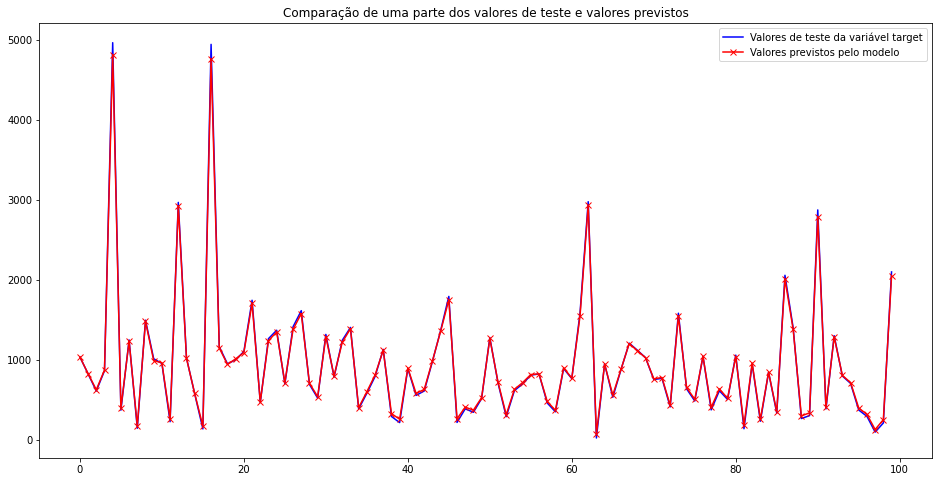

In [ ]:
# Plotting de gráfico comparando os valores de teste da variável target e os valores previstos
plt.figure(figsize=(16,8))
plt.title('Comparação de uma parte dos valores de teste e valores previstos')
plt.plot(y_test[:100], color='blue', label='Valores de teste da variável target')
plt.plot(prediction[:100], color='red', marker='x', label='Valores previstos pelo modelo')
plt.legend(loc='upper right')
plt.show()

In [ ]:
# Criando novo dataframe com os valores de teste da variável target e os valores previstos.
results = pd.DataFrame()
results['realValue_secd'] = y_test
results['predictedValue_secd'] = prediction

In [ ]:
# Transformando os valores de segundo para o formato datetime, de forma a converter os segundos em minutos
results['realValue_dtime'] = pd.to_datetime(results["realValue_secd"], unit='s')
results['predictedValue_dtime'] = pd.to_datetime(results["predictedValue_secd"], unit='s')

# Transformando os valores para o tipo string
results[['realValue_dtime', 'predictedValue_dtime']] = results[['realValue_dtime', 'predictedValue_dtime']].astype(str)

In [ ]:
# Selecinando apenas a parte do horário do formato datetime
results['realValue_time'] = results['realValue_dtime'].str.split(" ").str.get(1)
results['predictedValue_time'] = results['predictedValue_dtime'].str.split(" ").str.get(1)

In [ ]:
# Excluindo colunas que não são mais necessárias
results = results.drop(columns=['realValue_dtime', 'predictedValue_dtime'])

In [ ]:
results

,realValue_secd,predictedValue_secd,realValue_time,predictedValue_time
0,1040,1038.421526,00:17:20.000000000,00:17:18.421526219
1,827,830.862721,00:13:47.000000000,00:13:50.862721197
2,614,629.616687,00:10:14.000000000,00:10:29.616687378
3,867,876.035218,00:14:27.000000000,00:14:36.035218131
4,4967,4816.714536,01:22:47.000000000,01:20:16.714535551
...,...,...,...,...
437589,826,821.203677,00:13:46.000000000,00:13:41.203677435
437590,474,478.773017,00:07:54.000000000,00:07:58.773016941
437591,478,503.247640,00:07:58.000000000,00:08:23.247640192
437592,1139,1128.288967,00:18:59.000000000,00:18:48.288967410


> Ao analisar o *dataframe results* é possível ver que os valores previstos pelo o modelo se mantém próximos dos valores reais. Desta forma, temos que o modelo de regressão linear gerado está satisfatório para o problema. Alguns pontos podem ser melhorados, como por exemplo o desempenho do modelo com a métrica *MSE* e *RMSE*.